# Plot

> Accurate and interative data rendering

In [ ]:
#| default_exp plot

In [ ]:
#| hide
from nbdev.showdoc import *

In [ ]:
#| export
import numpy as np
import pandas as pd
import dask.dataframe as dd
from typing import Union

import holoviews as hv
import holoviews.operation.datashader as hd
import datashader as ds

Visualization of big data is hard.

For big raster image, ploting every pixels consumes too much time and memory and common picture format (e.g. png) do not support too big image.
One common solution is to resample to a smaller image and plot it, which is the default option
for common plot package (e.g. matplotlib).
But it will reduce the resolution and prevent showing local features.

For big point cloud image, besides the time and memory consumming, the overlapping of rendered points is also a problem.

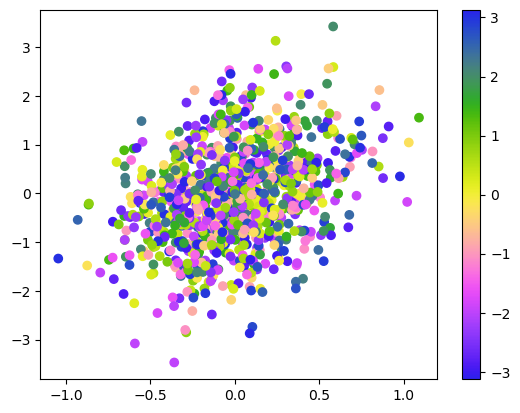

In [ ]:
#| echo: false
#| fig-cap: "An overlap example"
from matplotlib import pyplot as plt
import colorcet
coordinate = np.random.multivariate_normal((0,0), [[0.1, 0.1], [0.1, 1.0]], (1000,))
value = (np.random.random(1000)-0.5)*2*np.pi
plt.scatter(x=coordinate[:,0],y=coordinate[:,1],c=value,cmap=colorcet.cm.colorwheel)
plt.colorbar()
plt.show()

Here we provide the plot functions based on [Holoviews](https://holoviews.org/index.html) and [Datashader](https://datashader.org/) fix the problems.
The point cloud is resampled to a small raster image and then plotted on the screen.
The pixel size of the raster image is exactly matching the resolution of the screen to maximize the accuracy.
The plot is interative and the resampling is dynamic, which means when you zoom in, a more precise raster image is automatically generated and plotted. 

::: {.callout-note}
Note that the plotting functions here make use of dynamic updates, which require a running Jupyter server.
When viewed statically (as this documentation website), the plots will not update fully when you zoom.
:::

In [ ]:
#| export
def points(data:Union[pd.DataFrame,dd.DataFrame], # dataset to be plot
           kdims:list,# colomn name of Mercator coordinate in dataframe
           pdim:str, # column name of data to be plotted in dataframe
           prange:tuple=None, # range of data to be plotted, it is interactively adjusted by default
           aggregator=ds.first, # aggregator for data rasterization
           use_hover:bool=True, # use hover to show data
           vdims:list=None, # column name of data showed on hover except kdims and pdim. These two are always showed.
           google_earth:bool=False, # if use google earth imagery as the background
           ):
    '''Interative visulization of a point cloud image.
    '''
    if prange is None: prange = (None, None)
    if vdims is None: vdims = []
    if pdim in vdims: vdims.remove(pdim)
    vdims = [hv.Dimension(pdim,range=prange)] + vdims
    points = hv.Points(data,kdims=kdims, vdims=vdims)
    points = hd.rasterize(points,aggregator=aggregator(pdim),vdim_prefix='')
    points = hd.dynspread(points, max_px=5, threshold=0.2)
    if use_hover:
        highlight = hd.inspect_points(points).opts(marker='o',size=10,tools=['hover'])
        points = points*highlight
    if google_earth:
        geo_bg = hv.Tiles('https://mt1.google.com/vt/lyrs=s&x={X}&y={Y}&z={Z}',name='GoogleMapsImagery')
        points = geo_bg*points
    return points

Here we plot interferogram after DS processing:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
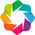

In [ ]:
import holoviews as hv
hv.extension('bokeh')
import datashader as ds
import zarr
from holoviews import opts

In [ ]:
ds_ph_ = '../Tutorials/CLI/ds_processing/ds_ph.zarr/'
ds_e_ = '../Tutorials/CLI/ds_processing/ds_e.zarr/'
ds_n_ = '../Tutorials/CLI/ds_processing/ds_n.zarr/'
ds_lon_ = '../Tutorials/CLI/ds_processing/ds_lon.zarr/'
ds_lat_ = '../Tutorials/CLI/ds_processing/ds_lon.zarr/'
ds_ph = zarr.open(ds_ph_,'r')[:]
ds_e = zarr.open(ds_e_,'r')[:]
ds_n = zarr.open(ds_n_,'r')[:]
ds_lon = zarr.open(ds_lon_,'r')[:]
ds_lat = zarr.open(ds_lat_,'r')[:]

In [ ]:
data = pd.DataFrame({'e':ds_e,'n':ds_n,'phase':np.angle(ds_ph[:,10]),'lon':ds_lon,'lat':ds_lat})
plot = points(data,kdims=['e','n'],pdim='phase',prange=(-np.pi,np.pi),vdims=['lon','lat'],google_earth=True)

Make some options on the plot:

In [ ]:
plot.opts(opts.Image(cmap='colorwheel',width=600, height=400, colorbar=True, xlabel='Longitude', ylabel='Latitude'),
          opts.Points(marker='o',size=10,tools=['hover']))

:DynamicMap   []
   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Image.I  :Image   [e,n]   (phase)
      .Points.I :Points   [e,n]   (phase,lon,lat)

Dask dataframe is also supported:

In [ ]:
import dask
from dask import array as da
from dask import dataframe as dd
from dask.distributed import Client, LocalCluster

In [ ]:
cluster = LocalCluster(); client = Client(cluster)

In [ ]:
ds_ph = da.from_zarr(ds_ph_)
ds_e = da.from_zarr(ds_e_)
ds_n = da.from_zarr(ds_n_)
ds_lon = da.from_zarr(ds_lon_)
ds_lat = da.from_zarr(ds_lat_)

ds_data = da.stack([ds_e,ds_n,ds_lon,ds_lat,da.angle(ds_ph[:,10])]).T
ds_df = dd.from_dask_array(ds_data,columns=['e','n','lon','lat','phase'])
ds_df = ds_df.persist() # only do it if the memory is enough
plot = points(ds_df,kdims=['e','n'],pdim='phase',prange=(-np.pi,np.pi),vdims=['lon','lat'],google_earth=True)

In [ ]:
plot.opts(opts.Image(cmap='colorwheel',width=600, height=400, colorbar=True, xlabel='Longitude', ylabel='Latitude'),
          opts.Points(marker='o',size=10,tools=['hover']))

:DynamicMap   []
   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Image.I  :Image   [e,n]   (phase)
      .Points.I :Points   [e,n]   (lon,lat,phase)

In [ ]:
cluster.close(); client.close()

In [ ]:
#| export
def points_stack(data:Union[pd.DataFrame,dd.DataFrame], # common data in all plots
                 kdims:list,# colomn name of Mercator coordinate in dataframe
                 pdata:Union[pd.DataFrame,dd.DataFrame], # data to be plotted as color
                 pdim:str, # label of pdata
                 prange:tuple=None, # range of pdata, it is interactively adjusted by default
                 aggregator=ds.first, # aggregator for data rasterization
                 use_hover:bool=True, # use hover to show other column
                 vdims:list=None, # column name of data showed on hover except kdims which are always showed.
                 google_earth:bool=False, # if use google earth imagery as the background
                ):
    '''Interative visulization of a stack of point cloud images.
    '''
    if prange is None: prange = (None, None)
    if vdims is None: vdims = []
    if pdim in vdims: vdims.remove(pdim)
    vdims = [hv.Dimension(pdim,range=prange)] + vdims

    plot_stack = {}
    for (name, column) in pdata.items():
        _data = data.copy(deep=False)
        _data[pdim] = column
        plot_stack[name] = hv.Points(_data,kdims=kdims,vdims=vdims)

    hmap = hv.HoloMap(plot_stack, kdims=pdim)
    hmap = hd.rasterize(hmap, aggregator=aggregator(pdim),vdim_prefix='')
    hmap = hd.dynspread(hmap, max_px=5, threshold=0.2)

    if use_hover:
        highlight = hd.inspect_points(hmap).opts(marker='o',size=10,tools=['hover'])
        hmap = hmap*highlight
    if google_earth:
        geo_bg = hv.Tiles('https://mt1.google.com/vt/lyrs=s&x={X}&y={Y}&z={Z}',name='GoogleMapsImagery')
        hmap = geo_bg*hmap
    return hmap

In [ ]:
ds_ph_ = '../Tutorials/CLI/ds_processing/ds_ph.zarr/'
ds_e_ = '../Tutorials/CLI/ds_processing/ds_e.zarr/'
ds_n_ = '../Tutorials/CLI/ds_processing/ds_n.zarr/'
ds_lon_ = '../Tutorials/CLI/ds_processing/ds_lon.zarr/'
ds_lat_ = '../Tutorials/CLI/ds_processing/ds_lon.zarr/'
ds_ph = zarr.open(ds_ph_,'r')[:]
ds_e = zarr.open(ds_e_,'r')[:]
ds_n = zarr.open(ds_n_,'r')[:]
ds_lon = zarr.open(ds_lon_,'r')[:]
ds_lat = zarr.open(ds_lat_,'r')[:]

import toml
meta_file = '../CLI/raw/meta.toml'
with open(meta_file,'r') as f:
    meta_data = toml.load(f)
dates = meta_data['dates']

In [ ]:
data = pd.DataFrame({'e':ds_e,'n':ds_n,'lon':ds_lon,'lat':ds_lat})
pdata = pd.DataFrame(np.angle(ds_ph),columns=dates)

In [ ]:
plot_stack = points_stack(data,['e','n'],pdata,'phase',prange=(-np.pi,np.pi),vdims=['lon','lat'],google_earth=True)

In [ ]:
hv.output(widget_location='bottom',holomap='scrubber')

In [ ]:
plot_stack.opts(opts.Image(cmap='colorwheel',width=600, height=400, colorbar=True, xlabel='Longitude', ylabel='Latitude'),
                opts.Points(marker='o',size=10))

:DynamicMap   [phase]
   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Image.I  :Image   [e,n]   (phase)
      .Points.I :Points   [e,n]   (phase,lon,lat)

Plot selected images simutaneously is also supported:

In [ ]:
plot_stack.layout()[dates[0:4]].cols(2)

:NdLayout   [phase]
   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Image.I  :Image   [e,n]   (phase)
      .Points.I :Points   [e,n]   (phase,lon,lat)

In [ ]:
cluster = LocalCluster(); client = Client(cluster)

In [ ]:
ds_ph = da.from_zarr(ds_ph_)
ds_e = da.from_zarr(ds_e_)
ds_n = da.from_zarr(ds_n_)
ds_lon = da.from_zarr(ds_lon_)
ds_lat = da.from_zarr(ds_lat_)

import toml
meta_file = '../CLI/raw/meta.toml'
with open(meta_file,'r') as f:
    meta_data = toml.load(f)
dates = meta_data['dates']

data = da.stack([ds_e,ds_n,ds_lon,ds_lat]).T
data = dd.from_dask_array(data,columns=['e','n','lon','lat'])
pdata = dd.from_dask_array(da.angle(ds_ph),columns=dates)
data = data.persist(); pdata=pdata.persist() # only do it if the memory is enough

In [ ]:
plot_stack = points_stack(data,kdims=['e','n'],pdata=pdata,pdim='phase',prange=(-np.pi,np.pi),vdims=['lon','lat'],google_earth=True)

In [ ]:
hv.output(widget_location='bottom',holomap='scrubber')

In [ ]:
plot_stack.opts(opts.Image(cmap='colorwheel',width=600, height=400, colorbar=True, xlabel='Longitude', ylabel='Latitude'),
                opts.Points(marker='o',size=10))

:DynamicMap   [phase]
   :Overlay
      .Tiles.I  :Tiles   [x,y]
      .Image.I  :Image   [e,n]   (phase)
      .Points.I :Points   [e,n]   (lon,lat,phase)

In [ ]:
cluster.close(); client.close()

In [ ]:
#| export
def bg_alpha(pwr):
    _pwr = np.power(pwr,0.35)
    cv = _pwr.mean()*2.5
    v = (_pwr.clip(0., cv))/cv
    return v

In [ ]:
#| hide
import nbdev; nbdev.nbdev_export()